In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
data = pd.read_csv(r'cars.csv')
data.head()

,Name,Location,Year,Kilometers_Driven,Fuel_Type,Transmission,Owner_Type,Mileage,Engine,Power,Seats,New_Price,Price
0,Maruti Wagon R LXI CNG,Mumbai,2010,72000,CNG,Manual,First,26.6 km/kg,998 CC,58.16 bhp,5.0,NaN,1.75
1,Hyundai Creta 1.6 CRDi SX Option,Pune,2015,41000,Diesel,Manual,First,19.67 kmpl,1582 CC,126.2 bhp,5.0,NaN,12.50
2,Honda Jazz V,Chennai,2011,46000,Petrol,Manual,First,18.2 kmpl,1199 CC,88.7 bhp,5.0,8.61 Lakh,4.50
3,Maruti Ertiga VDI,Chennai,2012,87000,Diesel,Manual,First,20.77 kmpl,1248 CC,88.76 bhp,7.0,NaN,6.00
4,Audi A4 New 2.0 TDI Multitronic,Coimbatore,2013,40670,Diesel,Automatic,Second,15.2 kmpl,1968 CC,140.8 bhp,5.0,NaN,17.74


In [3]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6019 entries, 0 to 6018
Data columns (total 13 columns):
Name                 6019 non-null object
Location             6019 non-null object
Year                 6019 non-null int64
Kilometers_Driven    6019 non-null int64
Fuel_Type            6019 non-null object
Transmission         6019 non-null object
Owner_Type           6019 non-null object
Mileage              6017 non-null object
Engine               5983 non-null object
Power                5983 non-null object
Seats                5977 non-null float64
New_Price            824 non-null object
Price                6019 non-null float64
dtypes: float64(2), int64(2), object(9)
memory usage: 399.8+ KB


In [4]:
data.loc[data['New_Price'].isna() == False].head()
# New Price is price of the new car, but we do not have it for all the data rows. 
# It will be wise to drop this column all together.

,Name,Location,Year,Kilometers_Driven,Fuel_Type,Transmission,Owner_Type,Mileage,Engine,Power,Seats,New_Price,Price
2,Honda Jazz V,Chennai,2011,46000,Petrol,Manual,First,18.2 kmpl,1199 CC,88.7 bhp,5.0,8.61 Lakh,4.50
7,Toyota Innova Crysta 2.8 GX AT 8S,Mumbai,2016,36000,Diesel,Automatic,First,11.36 kmpl,2755 CC,171.5 bhp,8.0,21 Lakh,17.50
10,Maruti Ciaz Zeta,Kochi,2018,25692,Petrol,Manual,First,21.56 kmpl,1462 CC,103.25 bhp,5.0,10.65 Lakh,9.95
15,Mitsubishi Pajero Sport 4X4,Delhi,2014,110000,Diesel,Manual,First,13.5 kmpl,2477 CC,175.56 bhp,7.0,32.01 Lakh,15.00
20,BMW 3 Series 320d,Kochi,2014,32982,Diesel,Automatic,First,22.69 kmpl,1995 CC,190 bhp,5.0,47.87 Lakh,18.55


In [5]:
data.drop(columns = 'New_Price', axis = 0, inplace = True)

In [6]:
data.head()

,Name,Location,Year,Kilometers_Driven,Fuel_Type,Transmission,Owner_Type,Mileage,Engine,Power,Seats,Price
0,Maruti Wagon R LXI CNG,Mumbai,2010,72000,CNG,Manual,First,26.6 km/kg,998 CC,58.16 bhp,5.0,1.75
1,Hyundai Creta 1.6 CRDi SX Option,Pune,2015,41000,Diesel,Manual,First,19.67 kmpl,1582 CC,126.2 bhp,5.0,12.50
2,Honda Jazz V,Chennai,2011,46000,Petrol,Manual,First,18.2 kmpl,1199 CC,88.7 bhp,5.0,4.50
3,Maruti Ertiga VDI,Chennai,2012,87000,Diesel,Manual,First,20.77 kmpl,1248 CC,88.76 bhp,7.0,6.00
4,Audi A4 New 2.0 TDI Multitronic,Coimbatore,2013,40670,Diesel,Automatic,Second,15.2 kmpl,1968 CC,140.8 bhp,5.0,17.74


In [7]:
location_counts = data.Location.value_counts()
location_counts

Mumbai        790
Hyderabad     742
Kochi         651
Coimbatore    636
Pune          622
Delhi         554
Kolkata       535
Chennai       494
Jaipur        413
Bangalore     358
Ahmedabad     224
Name: Location, dtype: int64

In [8]:
import altair as alt
print(alt.__file__)

c:\users\acer\appdata\local\programs\python\python37-32\lib\site-packages\altair\__init__.py


In [9]:
location_counts = pd.DataFrame(data.Location.value_counts())
location_counts.reset_index(inplace = True)
location_counts.columns = ['Location','counts']

alt.Chart(location_counts).mark_bar(color = 'blue').encode(
    alt.X('Location', title='Location of listing'
    ),
    alt.Y('counts', title='# Cars listed for reselling'),
    alt.OpacityValue(0.7)
    
).configure_axis(
    grid=False
).configure_view(
    strokeWidth=0
)

alt.Chart(...)

In [10]:
year_counts = pd.DataFrame(data.Year.value_counts())
year_counts.reset_index(inplace = True)
year_counts.columns = ['Year','counts']

In [11]:
alt.Chart(year_counts).mark_line(color = 'red').encode(
    alt.X('Year', title='Year of listing',
        scale=alt.Scale(domain=(1998, 2020))
    ),
    alt.Y('counts', title='# Cars listed for reselling'),
    alt.OpacityValue(0.7)
    
).configure_axis(
    grid=False
).configure_view(
    strokeWidth=0
)

alt.Chart(...)

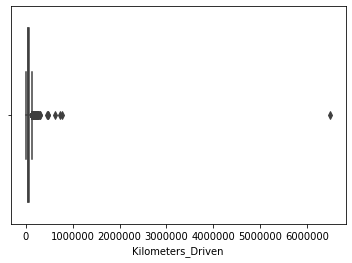

In [12]:
sns.boxplot(data['Kilometers_Driven'])

In [13]:
fuel_counts = pd.DataFrame(data.Fuel_Type.value_counts())
fuel_counts.reset_index(inplace = True)
fuel_counts.columns = ['Fuel','counts']

alt.Chart(fuel_counts).mark_bar(color = 'blue').encode(
    alt.X('Fuel', title='Fuel Type'
    ),
    alt.Y('counts', title='# Cars listed for reselling'),
    alt.OpacityValue(0.7)   
).configure_axis(
    grid=False
).configure_view(
    strokeWidth=0
)

alt.Chart(...)

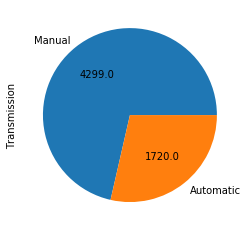

In [14]:
def absolute_value(val):
    a  = np.round(val/100.*data['Transmission'].value_counts().sum(), 0)
    return a

data.Transmission.value_counts().plot(kind = 'pie', autopct=absolute_value)

In [15]:
# data.Owner_Type.value_counts().plot(kind = 'pie')

Owner_Type = pd.DataFrame(data.Owner_Type.value_counts())
Owner_Type.reset_index(inplace = True)
Owner_Type.columns = ['Owner_Type','counts']

alt.Chart(Owner_Type).mark_bar(color = 'blue').encode(
    alt.X('Owner_Type', title='Owner_Type of listing'
    ),
    alt.Y('counts', title='# Cars listed for reselling'),
    #alt.OpacityValue(0.7)
    
).configure_axis(
    grid=False
).configure_view(
    strokeWidth=0
)

alt.Chart(...)

In [16]:
data.Mileage.value_counts()

17.0 kmpl     172
18.9 kmpl     172
18.6 kmpl     119
20.36 kmpl     88
21.1 kmpl      86
             ... 
8.1 kmpl        1
14.59 kmpl      1
9.1 kmpl        1
22.8 km/kg      1
19.91 kmpl      1
Name: Mileage, Length: 442, dtype: int64

In [17]:
data.Engine.value_counts()

1197 CC    606
1248 CC    512
1498 CC    304
998 CC     259
2179 CC    240
          ... 
2487 CC      1
1489 CC      1
970 CC       1
2925 CC      1
2495 CC      1
Name: Engine, Length: 146, dtype: int64

In [18]:
data.Power.value_counts()

74 bhp        235
98.6 bhp      131
73.9 bhp      125
140 bhp       123
78.9 bhp      111
             ... 
333 bhp         1
192 bhp         1
135.1 bhp       1
181.04 bhp      1
112.4 bhp       1
Name: Power, Length: 372, dtype: int64

In [19]:
data.Seats.value_counts()

5.0     5014
7.0      674
8.0      134
4.0       99
6.0       31
2.0       16
10.0       5
9.0        3
0.0        1
Name: Seats, dtype: int64

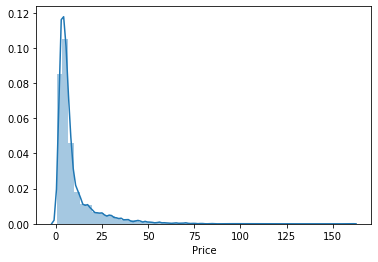

In [20]:
sns.distplot(data.Price)

In [21]:
data.Name.value_counts()

Mahindra XUV500 W8 2WD                        49
Maruti Swift VDI                              45
Honda City 1.5 S MT                           34
Maruti Swift Dzire VDI                        34
Maruti Swift VDI BSIV                         31
                                              ..
Skoda Fabia 1.6 MPI Elegance                   1
BMW Z4 2009-2013 35i                           1
Nissan Micra XV                                1
Volkswagen Passat 2.0 PD DSG                   1
Mahindra TUV 300 2015-2019 mHAWK100 T8 AMT     1
Name: Name, Length: 1876, dtype: int64

In [22]:
data['Brand'] = data['Name'].str.extract(r'([^\s]+)')

In [23]:
data.head()

,Name,Location,Year,Kilometers_Driven,Fuel_Type,Transmission,Owner_Type,Mileage,Engine,Power,Seats,Price,Brand
0,Maruti Wagon R LXI CNG,Mumbai,2010,72000,CNG,Manual,First,26.6 km/kg,998 CC,58.16 bhp,5.0,1.75,Maruti
1,Hyundai Creta 1.6 CRDi SX Option,Pune,2015,41000,Diesel,Manual,First,19.67 kmpl,1582 CC,126.2 bhp,5.0,12.50,Hyundai
2,Honda Jazz V,Chennai,2011,46000,Petrol,Manual,First,18.2 kmpl,1199 CC,88.7 bhp,5.0,4.50,Honda
3,Maruti Ertiga VDI,Chennai,2012,87000,Diesel,Manual,First,20.77 kmpl,1248 CC,88.76 bhp,7.0,6.00,Maruti
4,Audi A4 New 2.0 TDI Multitronic,Coimbatore,2013,40670,Diesel,Automatic,Second,15.2 kmpl,1968 CC,140.8 bhp,5.0,17.74,Audi


In [24]:
data['Brand'].value_counts()

Maruti           1211
Hyundai          1107
Honda             608
Toyota            411
Mercedes-Benz     318
Volkswagen        315
Ford              300
Mahindra          272
BMW               267
Audi              236
Tata              186
Skoda             173
Renault           145
Chevrolet         121
Nissan             91
Land               60
Jaguar             40
Fiat               28
Mitsubishi         27
Mini               26
Volvo              21
Porsche            18
Jeep               15
Datsun             13
Force               3
ISUZU               2
Isuzu               1
Smart               1
Ambassador          1
Lamborghini         1
Bentley             1
Name: Brand, dtype: int64

In [25]:
data['Model'] = data['Name'].str.split().str.get(1)

In [26]:
data['Model'].value_counts()

Swift       353
City        270
i20         247
Verna       170
Innova      164
           ... 
Tiguan        1
Fortwo        1
Redi          1
SL-Class      1
Mustang       1
Name: Model, Length: 212, dtype: int64

In [27]:
Brand = pd.DataFrame(data.Brand.value_counts())
Brand.reset_index(inplace = True)
Brand.columns = ['Brand','counts']

alt.Chart(Brand).mark_bar(color = 'blue').encode(
    alt.X('Brand', title='Brand of listing'
    ),
    alt.Y('counts', title='# Cars listed for reselling'),
    #alt.OpacityValue(0.7)
    
).configure_axis(
    grid=False
).configure_view(
    strokeWidth=0
).interactive()

alt.Chart(...)

In [28]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6019 entries, 0 to 6018
Data columns (total 14 columns):
Name                 6019 non-null object
Location             6019 non-null object
Year                 6019 non-null int64
Kilometers_Driven    6019 non-null int64
Fuel_Type            6019 non-null object
Transmission         6019 non-null object
Owner_Type           6019 non-null object
Mileage              6017 non-null object
Engine               5983 non-null object
Power                5983 non-null object
Seats                5977 non-null float64
Price                6019 non-null float64
Brand                6019 non-null object
Model                6019 non-null object
dtypes: float64(2), int64(2), object(10)
memory usage: 423.3+ KB


In [29]:
data['Mileage'] = data['Mileage'].str.split().str.get(0).astype(float)

In [30]:
data['Engine'] = data['Engine'].str.split().str.get(0).astype(float)

In [31]:
data['Power'] = data['Power'].str.split().str.get(0)

In [32]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6019 entries, 0 to 6018
Data columns (total 14 columns):
Name                 6019 non-null object
Location             6019 non-null object
Year                 6019 non-null int64
Kilometers_Driven    6019 non-null int64
Fuel_Type            6019 non-null object
Transmission         6019 non-null object
Owner_Type           6019 non-null object
Mileage              6017 non-null float64
Engine               5983 non-null float64
Power                5983 non-null object
Seats                5977 non-null float64
Price                6019 non-null float64
Brand                6019 non-null object
Model                6019 non-null object
dtypes: float64(4), int64(2), object(8)
memory usage: 470.3+ KB


In [33]:
#data.loc[data['Power'] == 'null'] = np.nan

In [34]:
#data['Power'] = data['Power'].astype(float)

In [35]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6019 entries, 0 to 6018
Data columns (total 14 columns):
Name                 6019 non-null object
Location             6019 non-null object
Year                 6019 non-null int64
Kilometers_Driven    6019 non-null int64
Fuel_Type            6019 non-null object
Transmission         6019 non-null object
Owner_Type           6019 non-null object
Mileage              6017 non-null float64
Engine               5983 non-null float64
Power                5983 non-null object
Seats                5977 non-null float64
Price                6019 non-null float64
Brand                6019 non-null object
Model                6019 non-null object
dtypes: float64(4), int64(2), object(8)
memory usage: 470.3+ KB


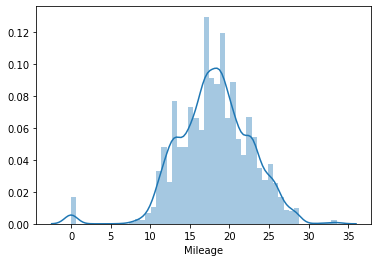

In [36]:
sns.distplot(data.Mileage)

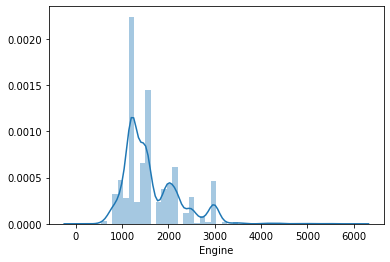

In [37]:
sns.distplot(data.Engine)

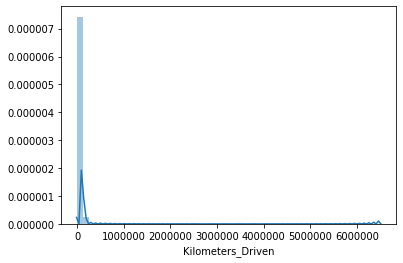

In [38]:
sns.distplot(data.Kilometers_Driven)

In [39]:
alt.data_transformers.disable_max_rows()

alt.Chart(data).mark_bar(color = 'blue').encode(
    alt.X('Brand', title='Brand of listing'
    ),
    alt.Y('Price', title='Reselling Price of the listed car'),
    alt.OpacityValue(0.7)
    
).configure_axis(
    grid=False
).configure_view(
    strokeWidth=0
).interactive()

alt.Chart(...)

In [40]:
alt.Chart(data).mark_bar(color = 'blue').encode(
    alt.Y('Price', title='Estimated Price' #,scale=alt.Scale(domain=(1998, 2020))
    ),
    alt.X('Brand', title='Total Number of Kilometers Driven'),
    alt.OpacityValue(0.7),
    alt.Color('Fuel_Type')
).configure_axis(
    grid=False
).configure_view(
    strokeWidth=0
).interactive()

alt.Chart(...)

In [41]:
data.head()

,Name,Location,Year,Kilometers_Driven,Fuel_Type,Transmission,Owner_Type,Mileage,Engine,Power,Seats,Price,Brand,Model
0,Maruti Wagon R LXI CNG,Mumbai,2010,72000,CNG,Manual,First,26.60,998.0,58.16,5.0,1.75,Maruti,Wagon
1,Hyundai Creta 1.6 CRDi SX Option,Pune,2015,41000,Diesel,Manual,First,19.67,1582.0,126.2,5.0,12.50,Hyundai,Creta
2,Honda Jazz V,Chennai,2011,46000,Petrol,Manual,First,18.20,1199.0,88.7,5.0,4.50,Honda,Jazz
3,Maruti Ertiga VDI,Chennai,2012,87000,Diesel,Manual,First,20.77,1248.0,88.76,7.0,6.00,Maruti,Ertiga
4,Audi A4 New 2.0 TDI Multitronic,Coimbatore,2013,40670,Diesel,Automatic,Second,15.20,1968.0,140.8,5.0,17.74,Audi,A4


In [42]:
alt.Chart(data).mark_bar(color = 'blue').encode(
    alt.Y('Price', title='Price'#scale=alt.Scale(domain=(1998, 2020))
    ),
    alt.X('Brand', title='Brand'),
    alt.OpacityValue(0.7),
    alt.Color('Owner_Type')
).configure_axis(
    grid=False
).configure_view(
    strokeWidth=0
).interactive()

alt.Chart(...)

In [43]:
alt.Chart(data).mark_bar(color = 'blue').encode(
    alt.Y('Price', title='Price'
    ),
    alt.X('Brand', title='Brand'),
    alt.OpacityValue(0.7),
    alt.Color('Transmission')
).configure_axis(
    grid=False
).configure_view(
    strokeWidth=0
).interactive()

alt.Chart(...)

In [44]:
alt.Chart(data).mark_line(color = 'blue').encode(
    alt.Y('Price', title='Price'
    ),
    alt.X('Power', title='Power'),
    alt.OpacityValue(0.7),
    #alt.Color('Transmission')
).configure_axis(
    grid=False
).configure_view(
    strokeWidth=0
).interactive()

alt.Chart(...)

In [45]:
alt.Chart(data).mark_bar(color = 'blue').encode(
    alt.Y('Price', title='Price'
    ),
    alt.X('Seats', title='Seats'),
    alt.OpacityValue(0.7),
    #alt.Color('Year')
).configure_axis(
    grid=False
).configure_view(
    strokeWidth=0
).interactive()

alt.Chart(...)

In [46]:
alt.Chart(data).mark_bar(color = 'blue').encode(
    alt.Y('Price', title='Price'
    ),
    alt.X('Model', title='Model'),
    alt.OpacityValue(0.7),
    alt.Color('Brand')
).configure_axis(
    grid=False
).configure_view(
    strokeWidth=0
).interactive()

alt.Chart(...)

In [47]:
data.loc[data['Power'] == 'null', 'Power'] = 0.0

In [48]:
data['Power'] = data['Power'].astype(float)

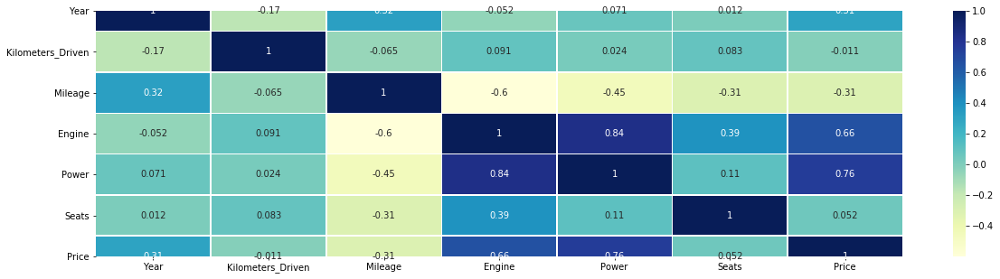

In [53]:
corr_mat = data.corr()
corr_mat

plt.figure(figsize=(20,5))

sns.heatmap(corr_mat, annot = True, linewidths=.5,cmap="YlGnBu")

In [ ]:
data.head()

In [ ]:
data.to_csv('datase', encoding='utf-8', index=False)